<a href="https://colab.research.google.com/github/adityakalra581/30-Days-of-Code/blob/master/face_identification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
import face_recognition
import os
import cv2
from google.colab.patches import cv2_imshow

## Running face_recognition package in Colab:

If you are running it for the first time:

- Go to Runtime --> Change Runtime Type --> Change it to GPU

- Run the cell below with command:  **pip install face_recognition**

## Running cv2.imshow in Google Colab:

Use this:

- from google.colab.patches import cv2_imshow

- Then Instead of cv2.imshow just use **cv2_imshow()**

In [2]:
pip install face_recognition

     |████████████████████████████████| 100.2MB 30kB/s 
  Created wheel for face-recognition-models: filename=face_recognition_models-0.3.0-py2.py3-none-any.whl size=100566172 sha256=1428c85ddca990407e2197c3a753cbd3bc12aa9347be5a7834695761dcf98853
  Stored in directory: /root/.cache/pip/wheels/d2/99/18/59c6c8f01e39810415c0e63f5bede7d83dfb0ffc039865465f
Successfully built face-recognition-models


loading
processing
43.jpeg
Match Not Found
Match Not Found
Match Not Found
Match Not Found
Match Not Found
Match Not Found


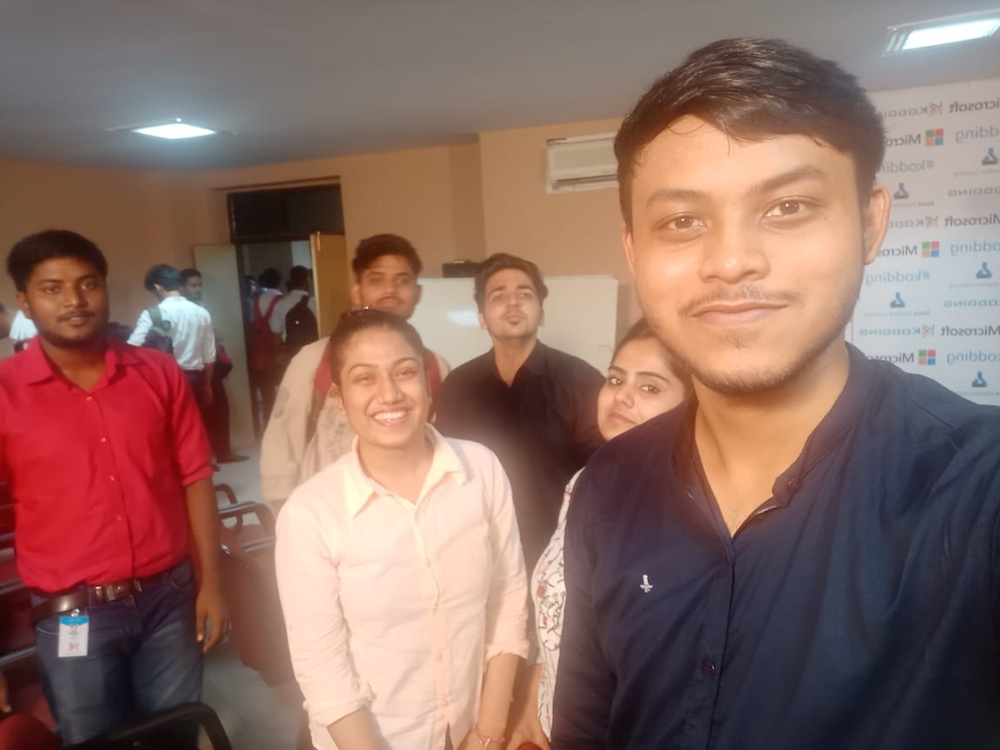

g1.jpeg
Match found: Aditya Kalra
Match Not Found
Match found: Mother
Match Not Found
Match Not Found


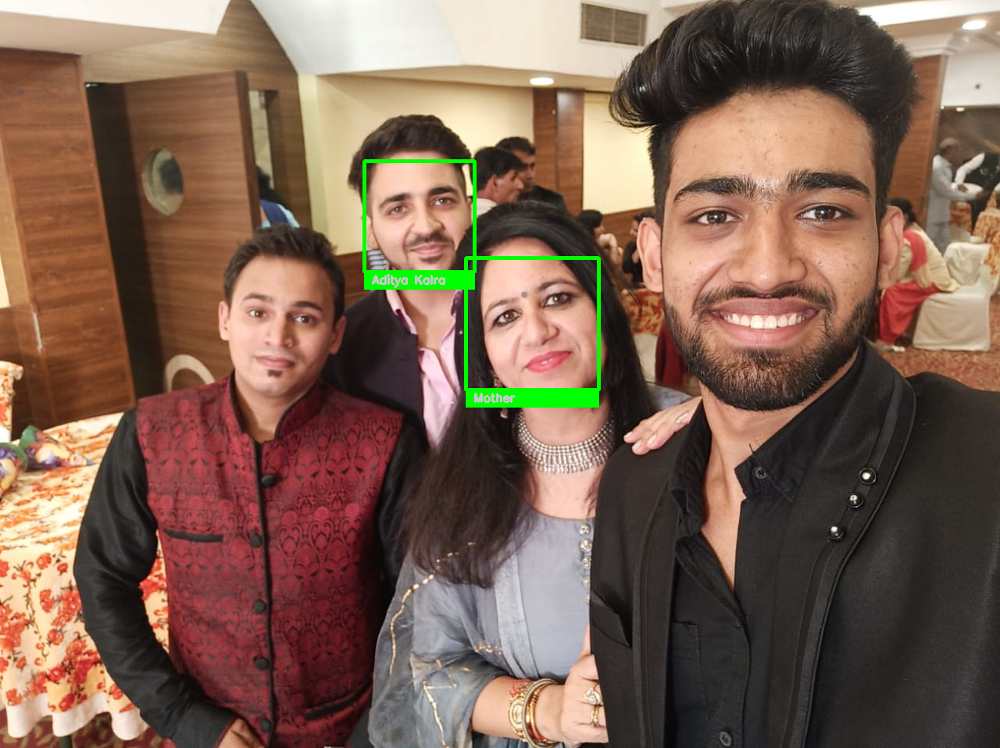

mask.jpeg
Match Not Found


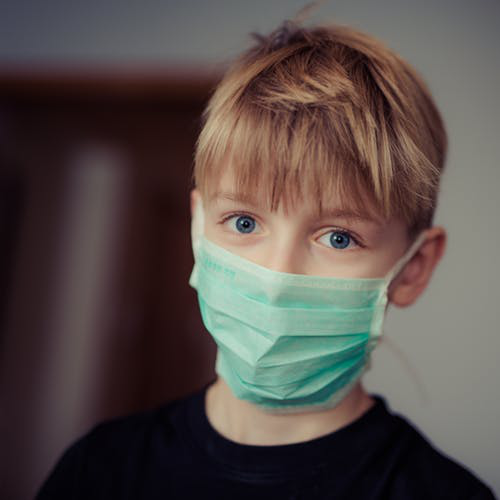

t.jpeg
Match found: Aditya Kalra
Match found: Srishti


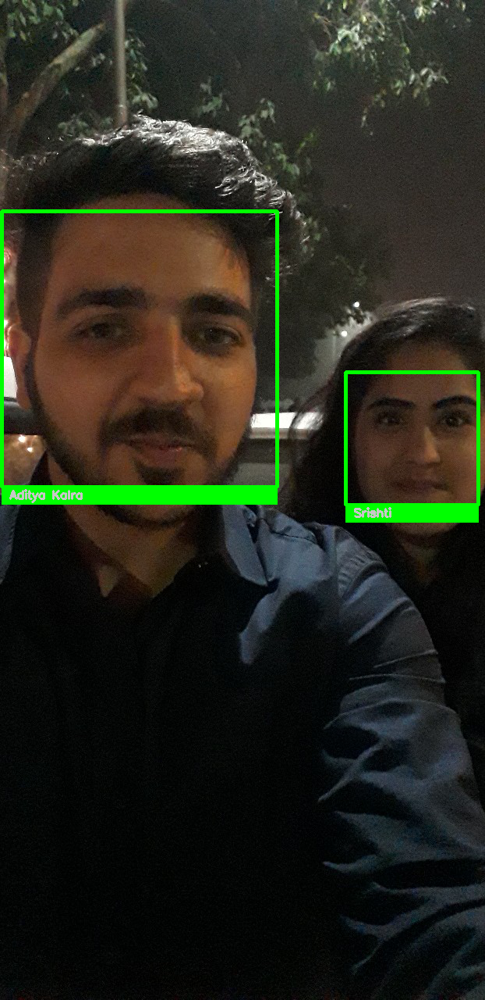

g3.jpeg
Match found: Aditya Kalra
Match Not Found
Match Not Found
Match found: Srishti


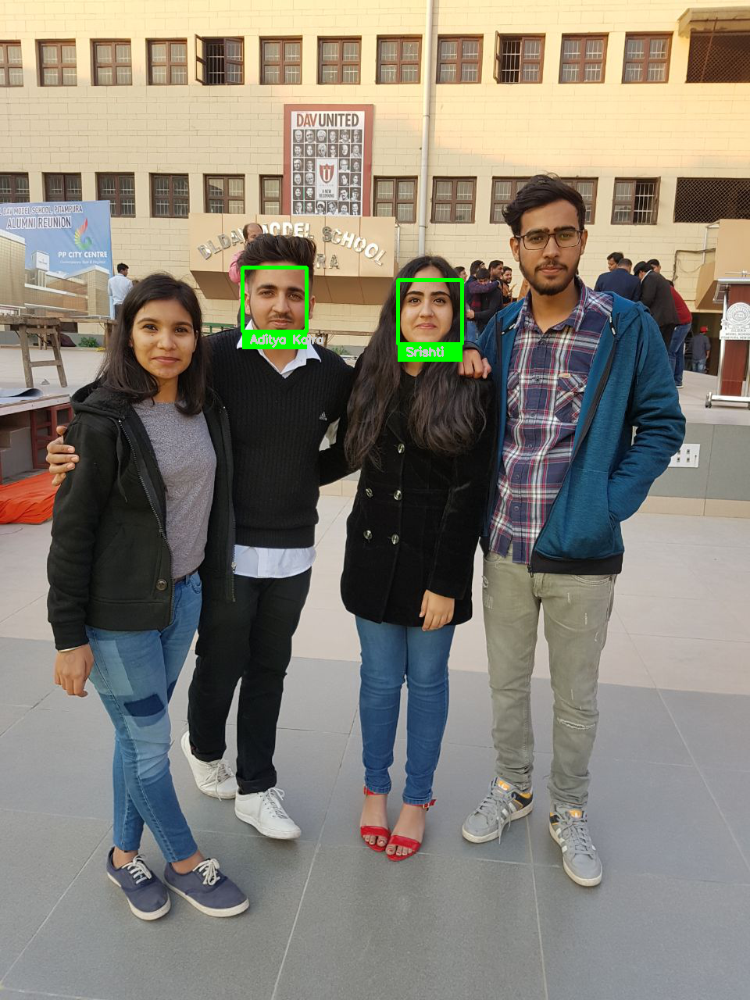

g2.jpeg
Match found: Aditya Kalra
Match Not Found
Match found: Srishti
Match Not Found
Match Not Found


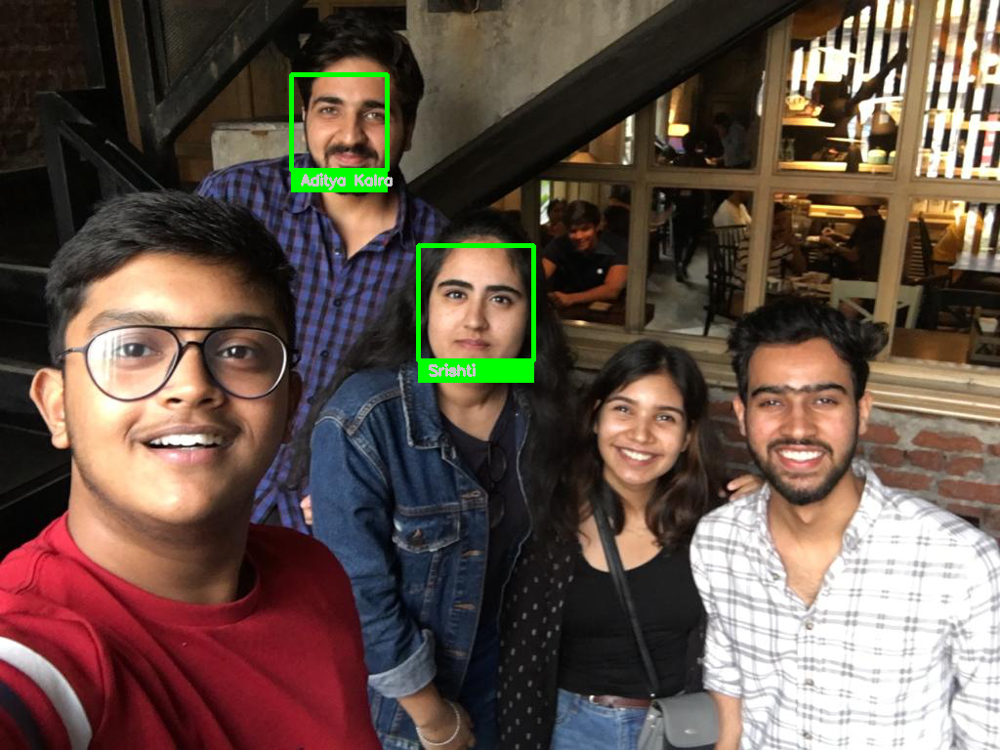

3.jpeg
Match found: Aditya Kalra


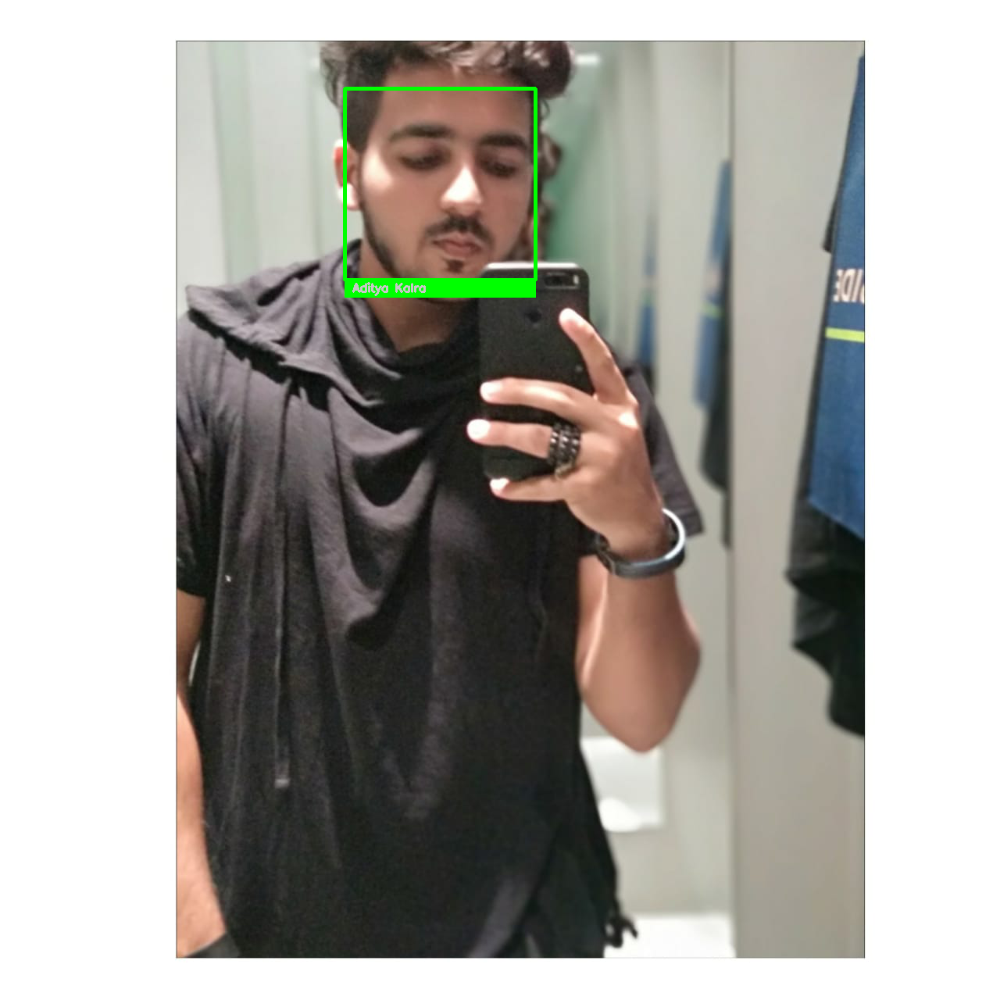

Better_Profile.jpeg
Match found: Aditya Kalra


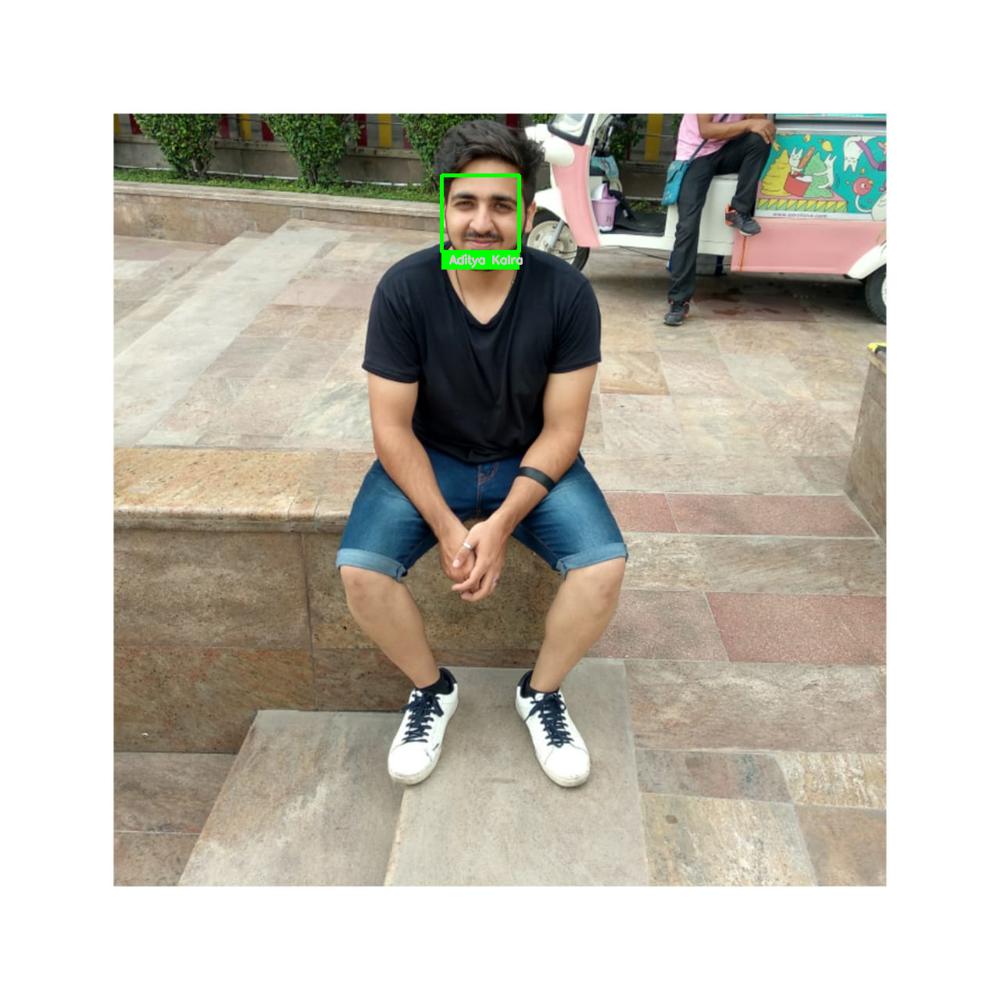

12.jpeg
Match Not Found
Match found: Aditya Kalra
Match Not Found
Match found: Srishti
Match Not Found


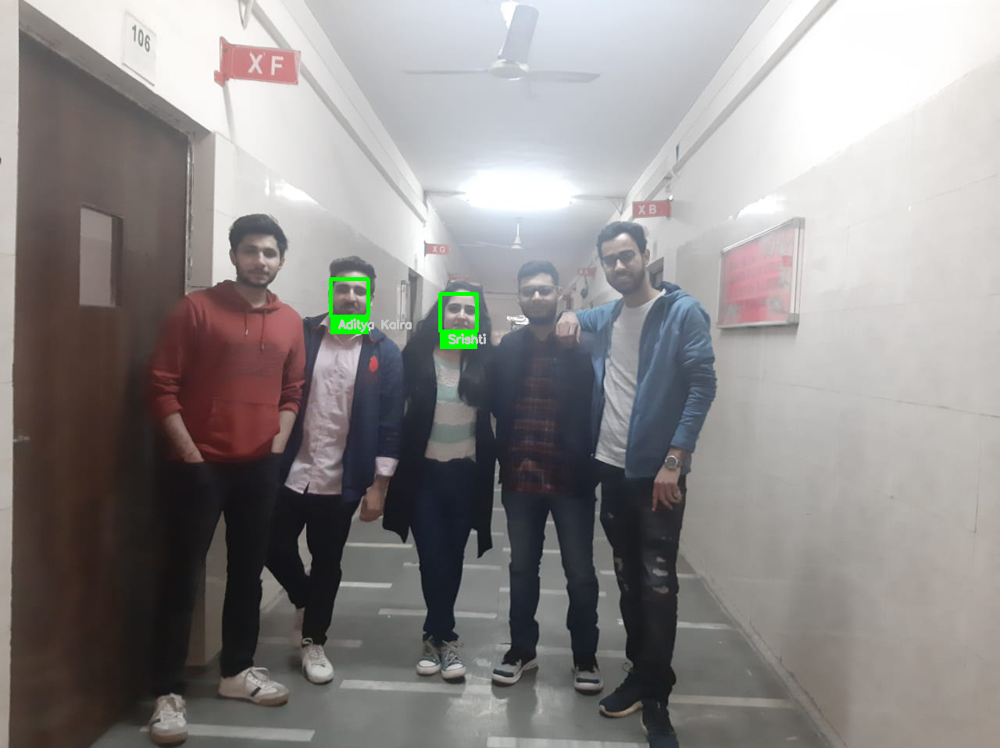

mask3.jpeg
Match Not Found


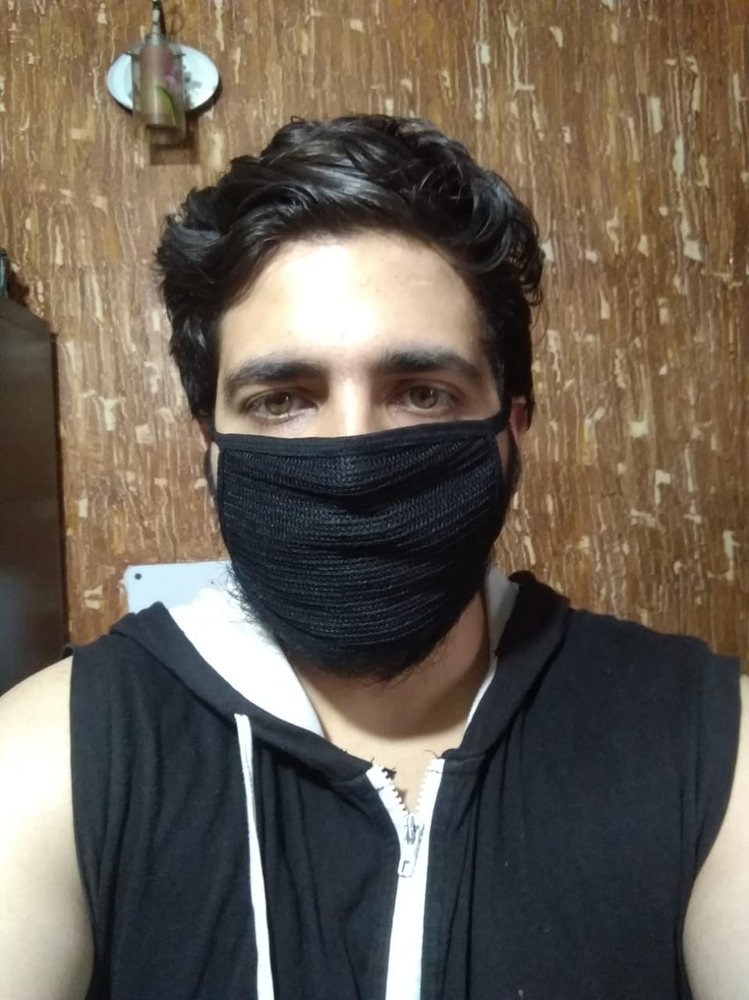

mask2.jpg
Match Not Found


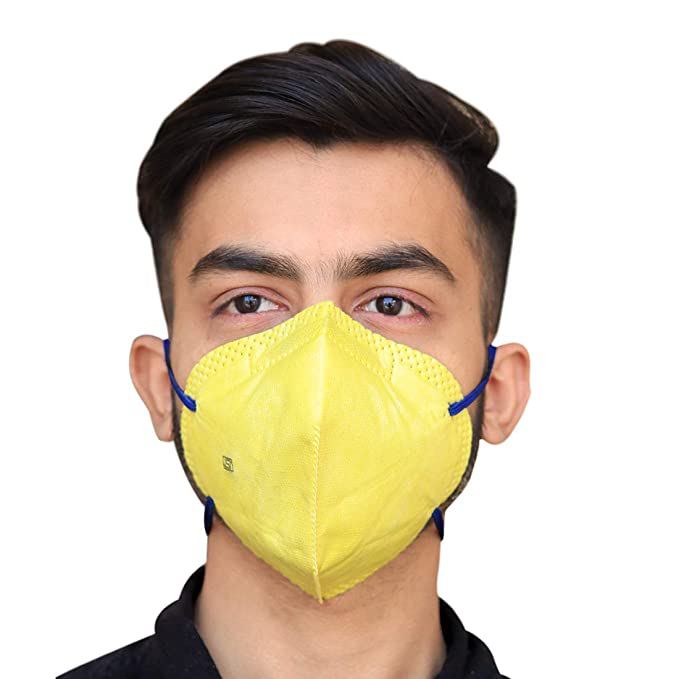

4.jpeg
Match Not Found


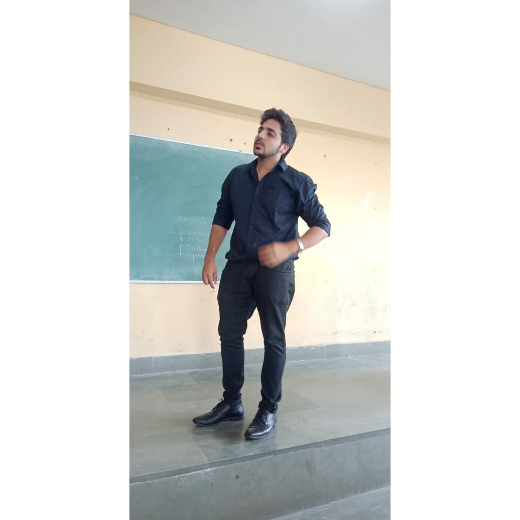

In [9]:
KNOWN_FACES_DIR = "known_faces"
UNKNOWN_FACES_DIR = "unknown_faces"
TOLERANCE = 0.5  
## 0-1, 
## higher value will give more matches but less accuracy.
## Lower value will give less matches with high accuracy.

FRAME_THICKNESS = 3
FONT_THICKNESS = 2
MODEL = "cnn"

print("loading")

known_faces = []
known_names = []

for name in os.listdir(KNOWN_FACES_DIR):
  for filename in os.listdir(f"{KNOWN_FACES_DIR}/{name}"):
    image = face_recognition.load_image_file(f"{KNOWN_FACES_DIR}/{name}/{filename}")
    encoding = face_recognition.face_encodings(image)[0]
    known_faces.append(encoding)
    known_names.append(name)

print("processing")
for filename in os.listdir(UNKNOWN_FACES_DIR):
  print(filename)
  image = face_recognition.load_image_file(f"{UNKNOWN_FACES_DIR}/{filename}")
  locations = face_recognition.face_locations(image, model = MODEL)
  encodings = face_recognition.face_encodings(image, locations)
  image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
  for face_encodings, face_location in zip(encodings, locations):
    results = face_recognition.compare_faces(known_faces, face_encodings, TOLERANCE)
    match = None
    if True in results:
      match = known_names[results.index(True)]
      print(f"Match found: {match}")

      # First Rectangle for Face Detection
      top_left = (face_location[3], face_location[0])
      bottom_right = (face_location[1], face_location[2])
      color = [0,255,0]
      cv2.rectangle(image, top_left,bottom_right, color, FRAME_THICKNESS)    

      # Second Rectangle for Name
      top_left = (face_location[3], face_location[2])
      bottom_right = (face_location[1], face_location[2]+22)
      color = [0,255,0]
      cv2.rectangle(image, top_left,bottom_right, color, cv2.FILLED)
      cv2.putText(image, match, (face_location[3]+10, face_location[2]+15), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (200,200,200), FONT_THICKNESS)
    else:
      print("Match Not Found")
  cv2_imshow(image)
  cv2.waitKey(0)
  cv2.destroyAllWindows()






